In [1]:
%load_ext pretty_jupyter

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

## Helper functions

In [3]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [4]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [5]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [6]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [7]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [8]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [9]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [10]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [11]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

In [12]:
def cluster_means(adata, clusters):
    obs_clusters = adata.obs.groupby(clusters)
    
    out = pd.DataFrame(
        np.zeros((adata.shape[1], len(obs_clusters)), dtype=np.float64),
        columns = list(obs_clusters.groups.keys()),
        index = adata.var.index
    )

    for group, idx in obs_clusters.indices.items():
        X = adata.X[idx]
        out[group] = np.ravel(X.mean(axis=0, dtype=np.float64))
    return out

In [13]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

## Markers for dotplots

In [14]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [15]:
class_markers = [
    'AIM2', # Lower in early memory
    'CD27', # CD27+
    'CD69', # Activated
    'FAS',  # CD95+
    'IGHA1', # Class switching
    'IGHM', # Class switching
    'IGHD', # Class switching
    'IGHG1', # Class switching
    'ITGAX',# CD11c Memory vs Effector
    'MZB1', # Plasmablasts
    'PRDM1',# Plasmablasts
    'TBX21',# Tbet
    'XBP1', # Plasmablasts
    'ZEB2'  #
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [16]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [17]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [18]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [19]:
search_id = 'rhenium-iodine-promethium'

Retrieve files stored in our HISE project store

In [20]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [21]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [22]:
search_df['AIFI_L3'].tolist()

['Activated memory B cell',
 'CD27- effector B cell',
 'CD27+ effector B cell',
 'CD95 memory B cell',
 'Core memory B cell',
 'Core naive B cell',
 'Early memory B cell',
 'ISG+ naive B cell',
 'Plasma cell',
 'Transitional B cell',
 'Type 2 polarized memory B cell']

## Review Activated Memory B

In [23]:
cell_type = 'Activated memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [24]:
type_uuid

'977bb7dd-d47c-4601-ac29-0b55b79d04b4'

In [25]:
adata = read_adata_uuid(type_uuid)

### Clustering

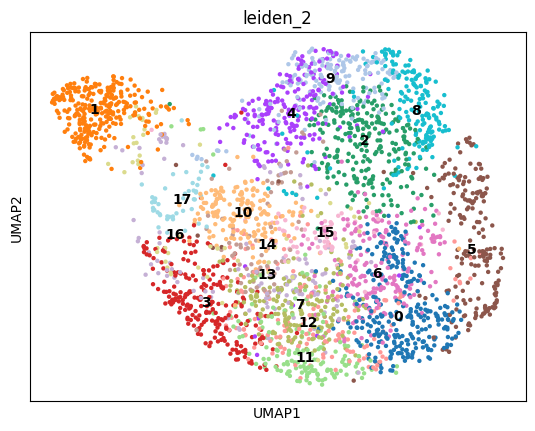

In [26]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

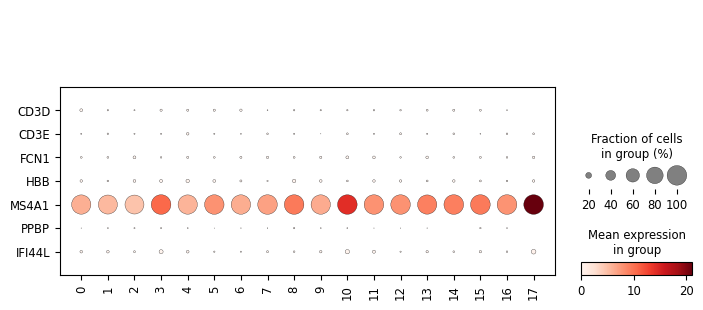

In [27]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

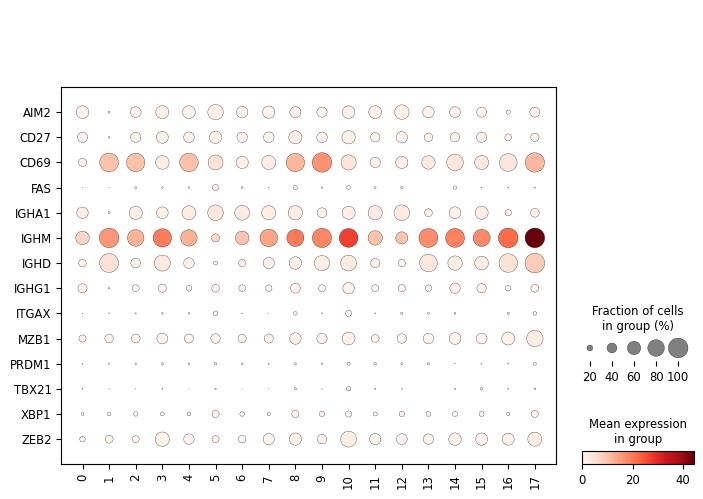

In [28]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

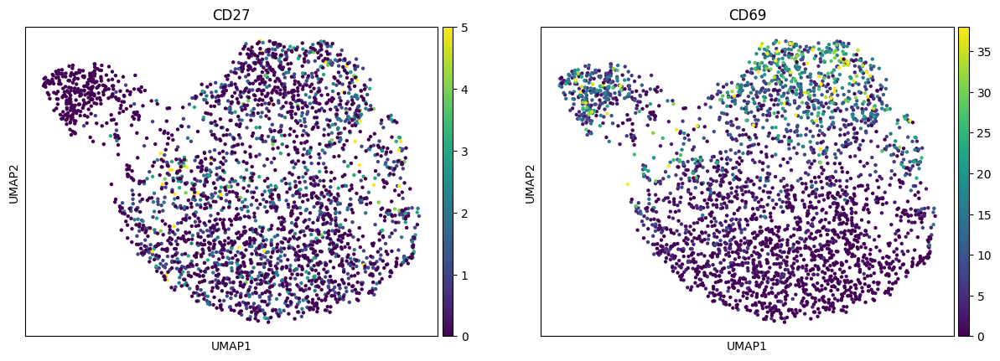

In [29]:
sc.pl.umap(adata, color = ['CD27','CD69'], vmax = 'p99')

### Cluster counts

In [30]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     289
1     286
2     255
3     229
4     209
5     196
6     194
7     182
8     180
9     170
10    164
11    150
12    145
13    113
14     75
15     64
16     54
17     47
Name: count, dtype: int64

### Investigating outliers

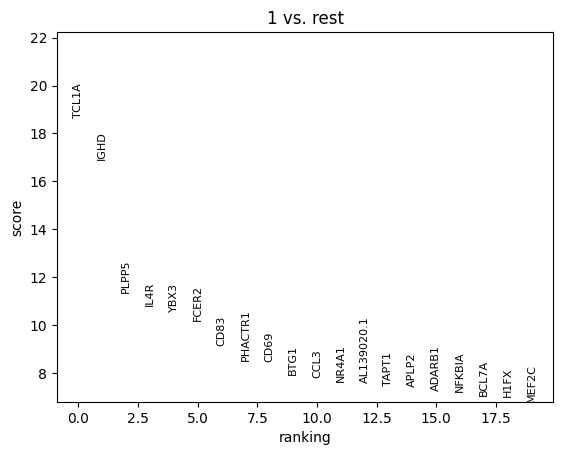

In [31]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1']
)
sc.pl.rank_genes_groups(adata)

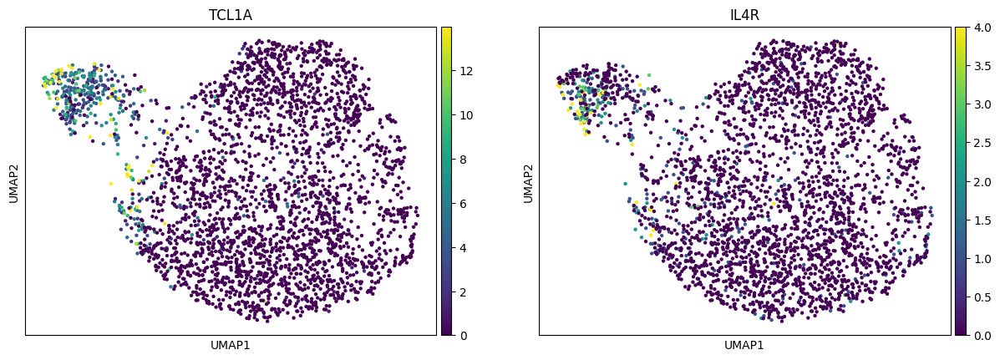

In [32]:
sc.pl.umap(adata, color = ['TCL1A','IL4R'], vmax = 'p99')

In [33]:
sc.pp.highly_variable_genes(adata)

In [34]:
hv_adata = adata[:,adata.var.highly_variable]
cl_means = cluster_means(hv_adata, 'leiden_2')
cl_means = cl_means.to_numpy().T

In [35]:
ac = AgglomerativeClustering(distance_threshold=0, linkage = 'average', n_clusters=None)
cl_hc = ac.fit(cl_means)

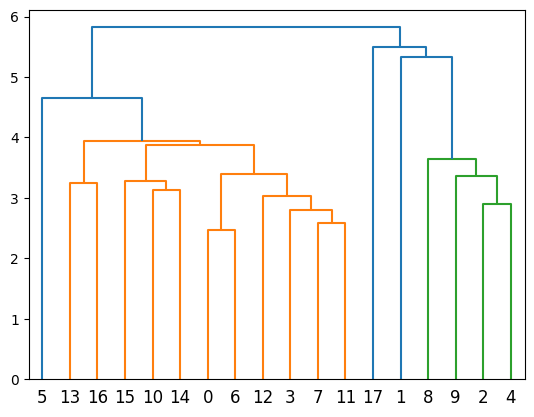

In [36]:
plot_dendrogram(cl_hc)

### Comparison to original labels

In [37]:
adata = add_labels(adata, original_df)

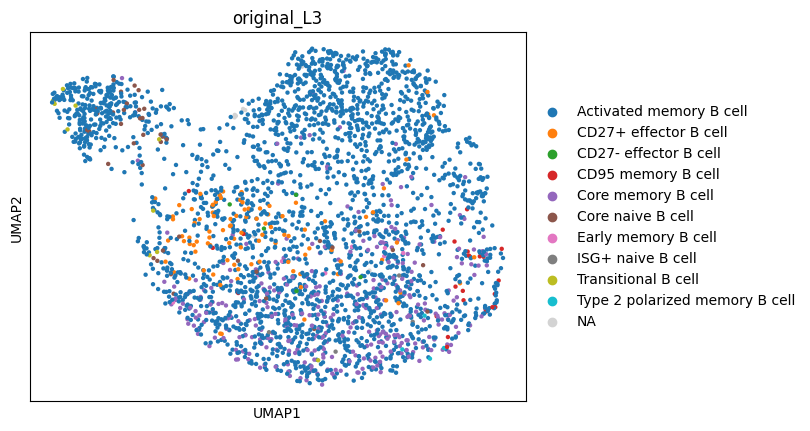

In [38]:
sc.pl.umap(adata, color = 'original_L3')

In [39]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Activated memory B cell           2467
Core memory B cell                 334
CD27+ effector B cell               97
Core naive B cell                   40
CD95 memory B cell                  24
Transitional B cell                 10
NaN                                  9
Early memory B cell                  8
CD27- effector B cell                5
ISG+ naive B cell                    4
Type 2 polarized memory B cell       4
Name: count, dtype: int64

In [40]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Activated memory B cell           0.821785
Core memory B cell                0.111259
CD27+ effector B cell             0.032312
Core naive B cell                 0.013324
CD95 memory B cell                0.007995
Transitional B cell               0.003331
NaN                               0.002998
Early memory B cell               0.002665
CD27- effector B cell             0.001666
ISG+ naive B cell                 0.001332
Type 2 polarized memory B cell    0.001332
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review CD27- effector B cell

In [41]:
cell_type = 'CD27- effector B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [42]:
type_uuid

'd2f422d2-7cb6-4efd-9ee8-0ed54addb683'

In [43]:
adata = read_adata_uuid(type_uuid)

### Clustering

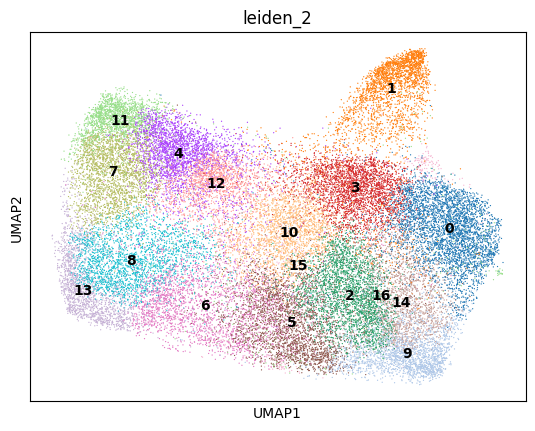

In [44]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

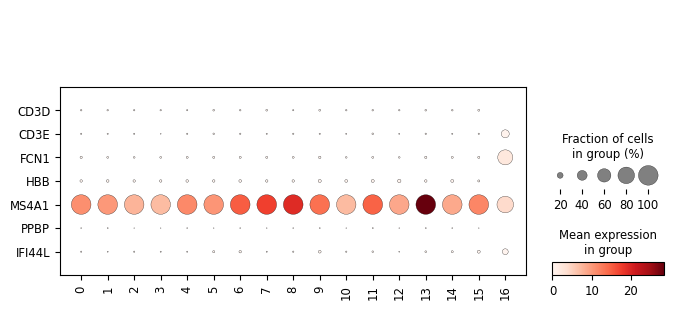

In [45]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

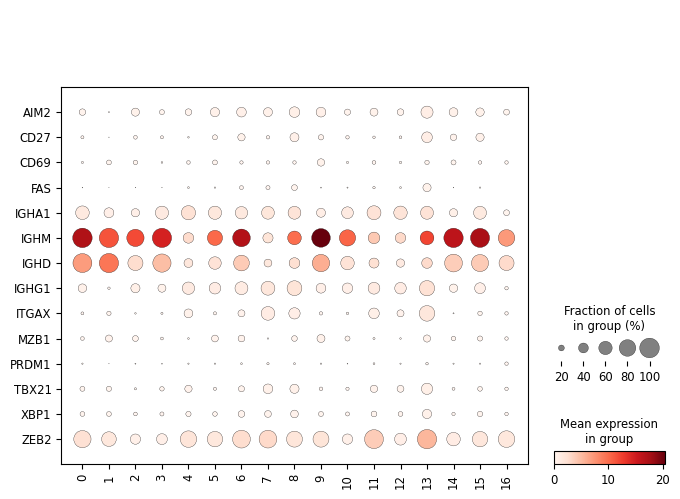

In [46]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

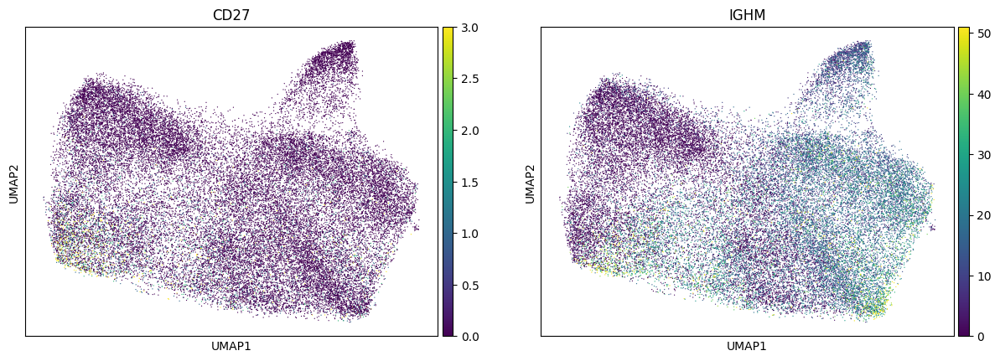

In [47]:
sc.pl.umap(adata, color = ['CD27','IGHM'], vmax = 'p99')

### Cluster counts

In [48]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     3708
1     2748
2     2722
3     2718
4     2601
5     2517
6     2486
7     2354
8     2273
9     2253
10    2005
11    1906
12    1736
13    1701
14    1662
15     728
16      10
Name: count, dtype: int64

### Investigating outliers

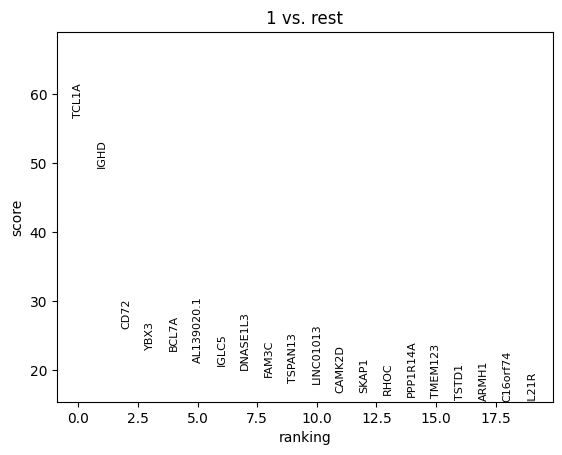

In [49]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1']
)
sc.pl.rank_genes_groups(adata)

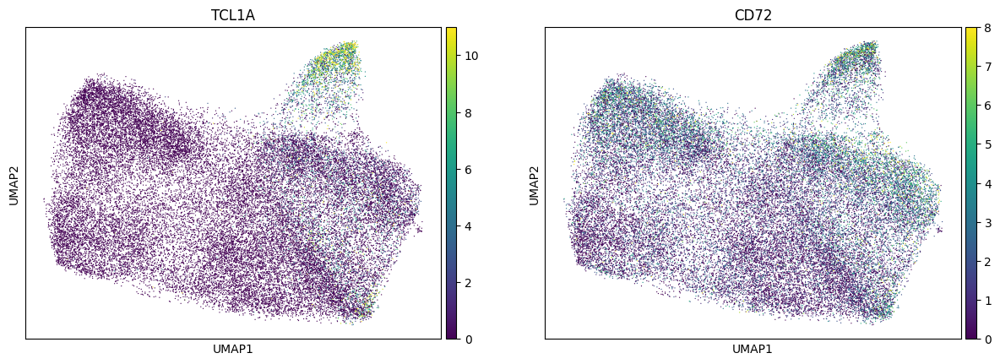

In [50]:
sc.pl.umap(adata, color = ['TCL1A','CD72'], vmax = 'p99')

### Comparison to original labels

In [51]:
adata = add_labels(adata, original_df)

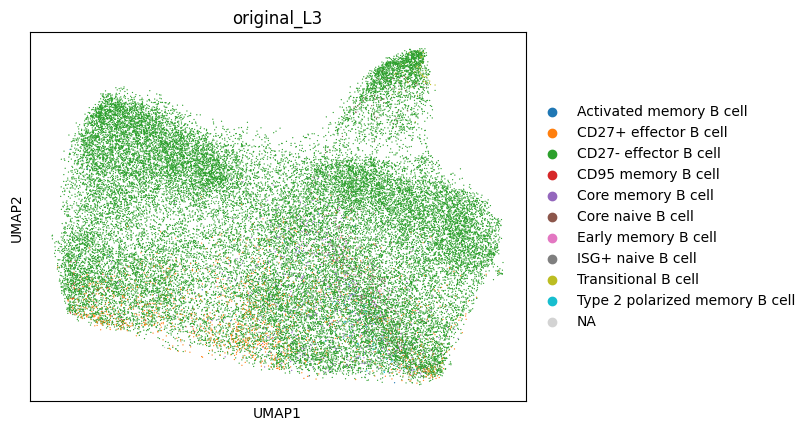

In [52]:
sc.pl.umap(adata, color = 'original_L3')

In [53]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD27- effector B cell             33271
CD27+ effector B cell              1305
Core memory B cell                  623
Core naive B cell                   437
Type 2 polarized memory B cell      108
NaN                                 103
Transitional B cell                  98
Early memory B cell                  79
CD95 memory B cell                   45
ISG+ naive B cell                    42
Activated memory B cell              17
Name: count, dtype: int64

In [54]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD27- effector B cell             0.920920
CD27+ effector B cell             0.036122
Core memory B cell                0.017244
Core naive B cell                 0.012096
Type 2 polarized memory B cell    0.002989
NaN                               0.002851
Transitional B cell               0.002713
Early memory B cell               0.002187
CD95 memory B cell                0.001246
ISG+ naive B cell                 0.001163
Activated memory B cell           0.000471
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review CD27+ effector B cell

In [55]:
cell_type = 'CD27+ effector B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [56]:
type_uuid

'4ce8eeaa-f2a5-47e9-bf27-e18b4bb2467e'

In [57]:
adata = read_adata_uuid(type_uuid)

### Clustering

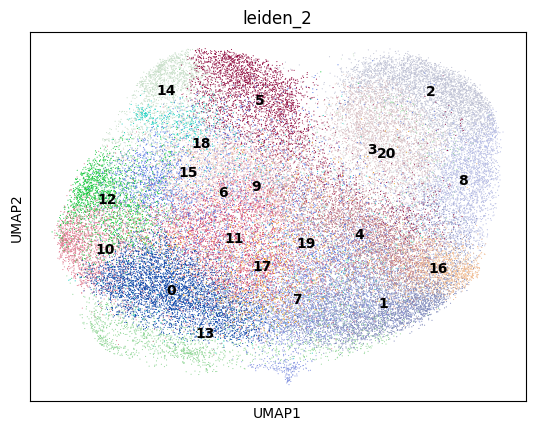

In [58]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

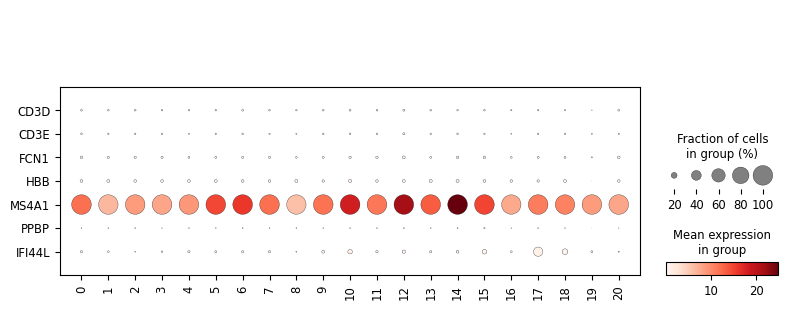

In [59]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

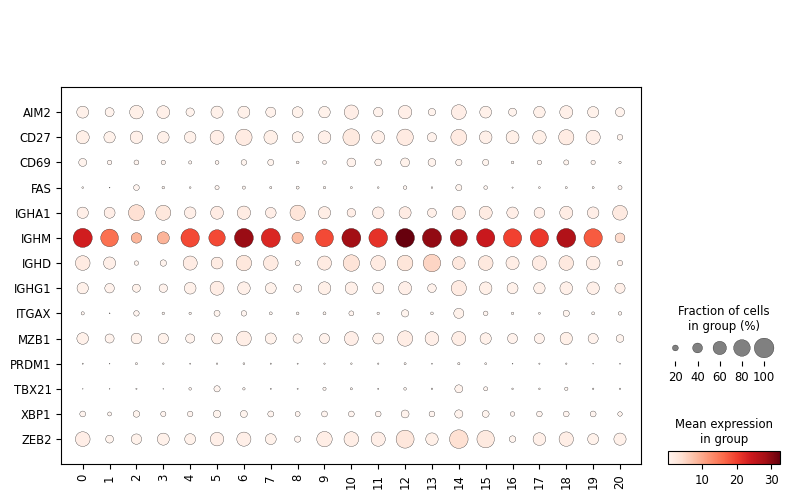

In [60]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

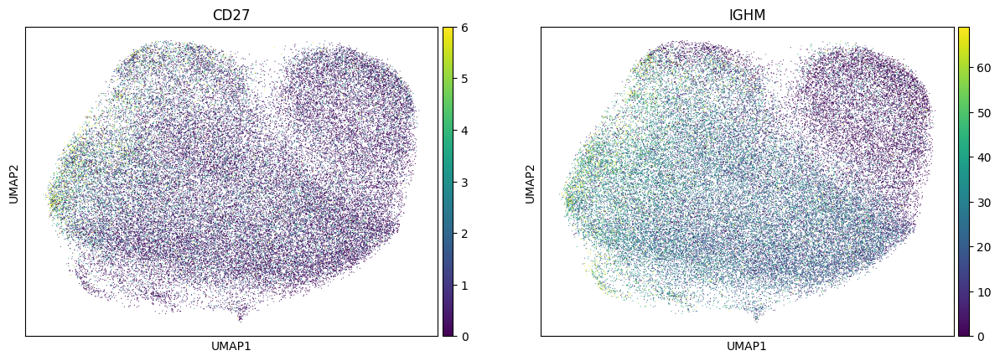

In [61]:
sc.pl.umap(adata, color = ['CD27','IGHM'], vmax = 'p99')

### Cluster counts

In [62]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     4312
1     4046
2     3700
3     3618
4     3546
5     3040
6     2881
7     2817
8     2773
9     2648
10    2562
11    2449
12    1956
13    1940
14    1627
15    1472
16    1390
17     984
18     822
19     783
20     551
Name: count, dtype: int64

### Investigating outliers

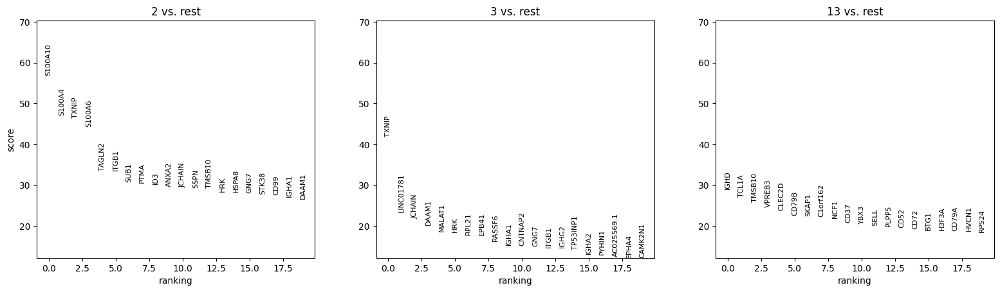

In [63]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['2','3','13']
)
sc.pl.rank_genes_groups(adata)

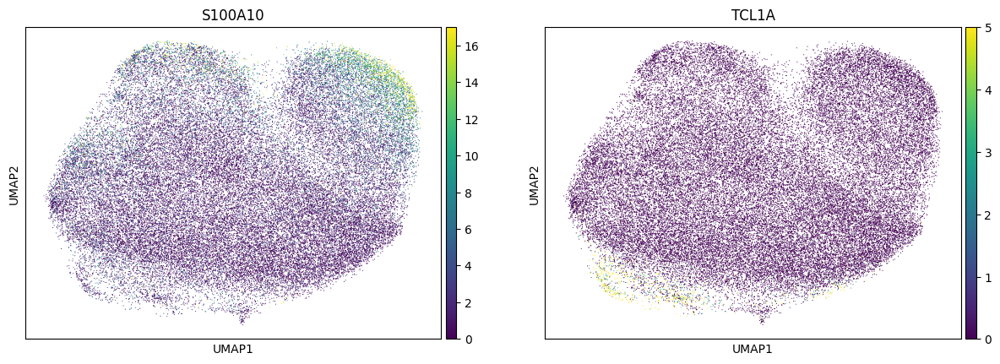

In [64]:
sc.pl.umap(adata, color = ['S100A10','TCL1A'], vmax = 'p99')

### Comparison to original labels

In [65]:
adata = add_labels(adata, original_df)

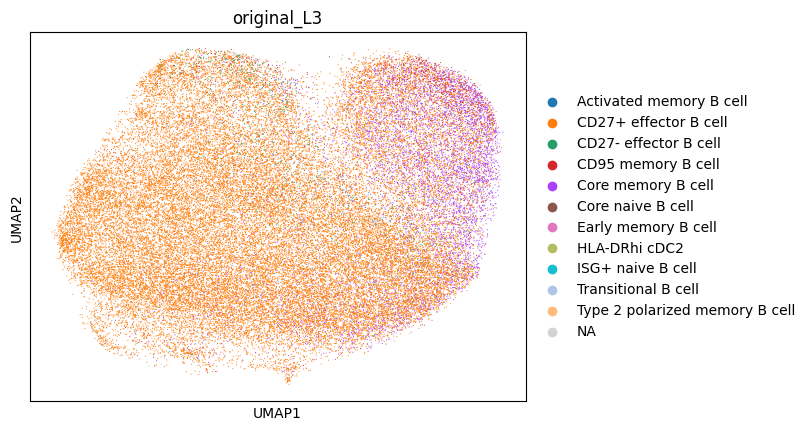

In [66]:
sc.pl.umap(adata, color = 'original_L3')

In [67]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD27+ effector B cell             41148
Core memory B cell                 6353
CD95 memory B cell                 1052
CD27- effector B cell               804
NaN                                 205
Early memory B cell                 131
ISG+ naive B cell                   112
Core naive B cell                    45
Activated memory B cell              30
Transitional B cell                  26
Type 2 polarized memory B cell       10
HLA-DRhi cDC2                         1
Name: count, dtype: int64

In [68]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD27+ effector B cell             0.824328
Core memory B cell                0.127271
CD95 memory B cell                0.021075
CD27- effector B cell             0.016107
NaN                               0.004107
Early memory B cell               0.002624
ISG+ naive B cell                 0.002244
Core naive B cell                 0.000901
Activated memory B cell           0.000601
Transitional B cell               0.000521
Type 2 polarized memory B cell    0.000200
HLA-DRhi cDC2                     0.000020
Name: count, dtype: float64

### Proposed updates

Should IgM- cells move to Core Memory B cell?

## Review CD95 memory B cell

In [69]:
cell_type = 'CD95 memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [70]:
type_uuid

'35ab271b-e6a2-43d2-aeb6-1a064a13efdf'

In [71]:
adata = read_adata_uuid(type_uuid)

### Clustering

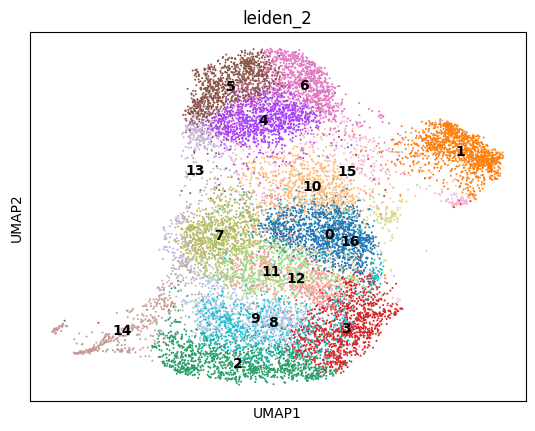

In [72]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

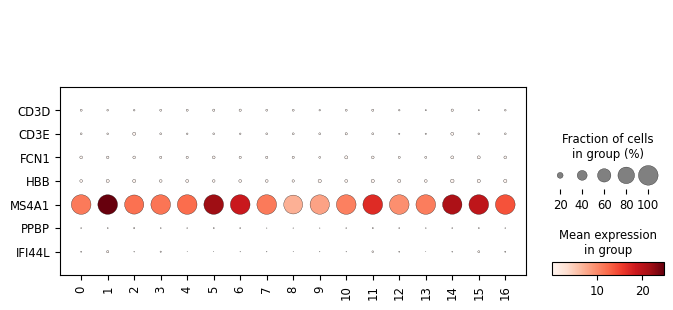

In [73]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

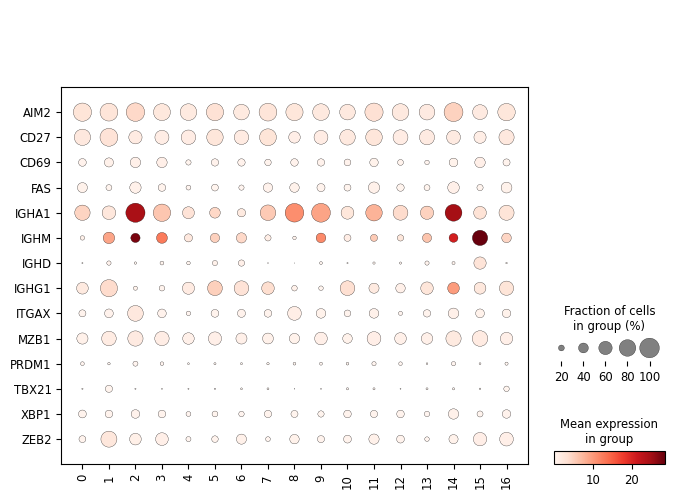

In [74]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

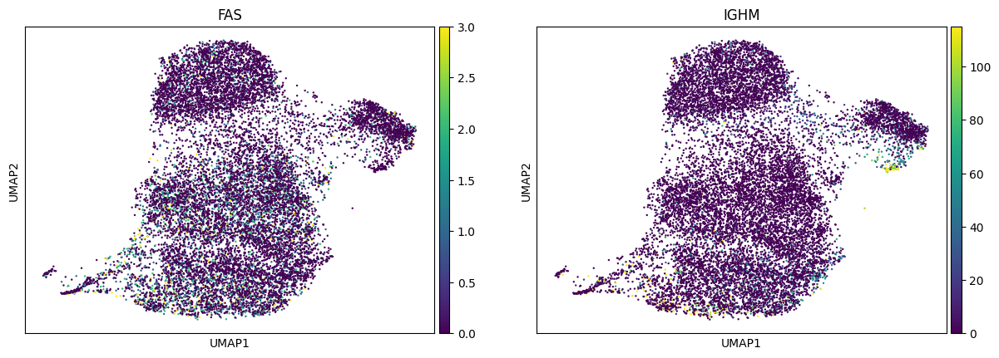

In [75]:
sc.pl.umap(adata, color = ['FAS','IGHM'], vmax = 'p99', size = 12)

### Cluster counts

In [76]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1296
1     1222
2     1140
3     1127
4     1124
5     1044
6      997
7      947
8      919
9      758
10     696
11     679
12     613
13     485
14     454
15     450
16     343
Name: count, dtype: int64

### Investigating outliers

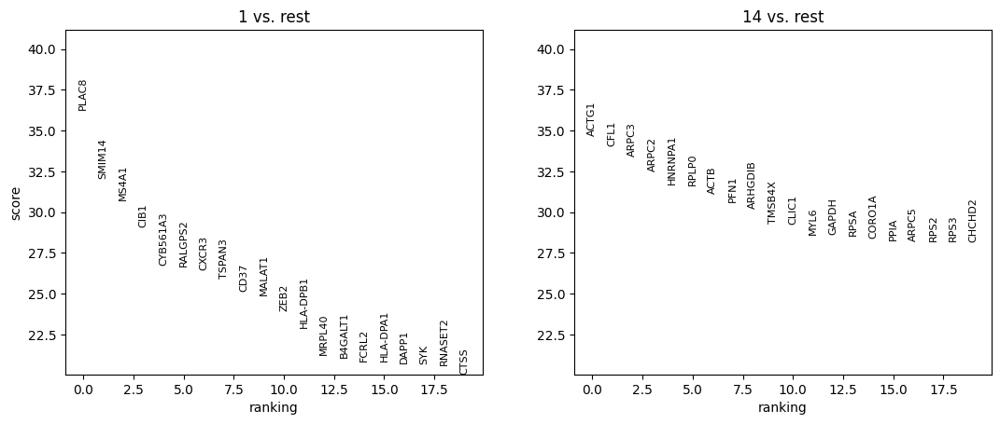

In [77]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['1','14']
)
sc.pl.rank_genes_groups(adata)

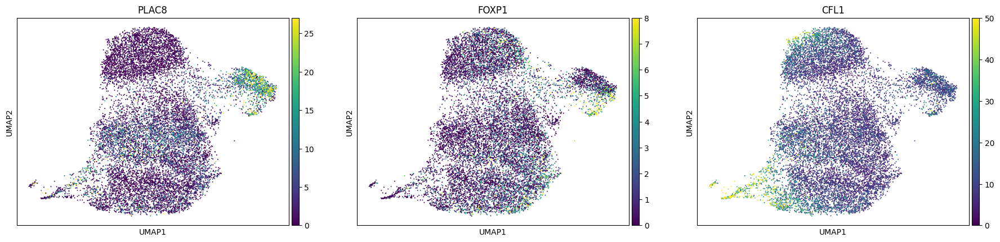

In [78]:
sc.pl.umap(adata, color = ['PLAC8','FOXP1','CFL1'], vmax = 'p99')

### Comparison to original labels

In [79]:
adata = add_labels(adata, original_df)

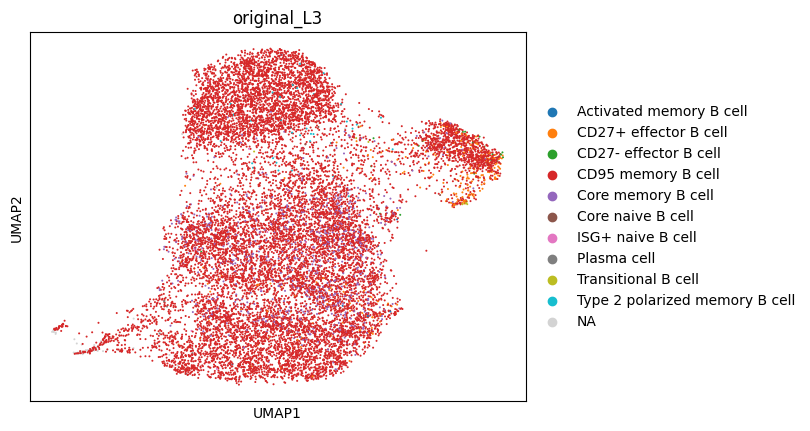

In [80]:
sc.pl.umap(adata, color = 'original_L3')

In [81]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD95 memory B cell                12953
Core memory B cell                  801
CD27+ effector B cell               314
NaN                                 112
Type 2 polarized memory B cell       38
CD27- effector B cell                24
ISG+ naive B cell                    19
Transitional B cell                  14
Activated memory B cell               8
Plasma cell                           7
Core naive B cell                     4
Name: count, dtype: int64

In [82]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD95 memory B cell                0.906184
Core memory B cell                0.056037
CD27+ effector B cell             0.021967
NaN                               0.007835
Type 2 polarized memory B cell    0.002658
CD27- effector B cell             0.001679
ISG+ naive B cell                 0.001329
Transitional B cell               0.000979
Activated memory B cell           0.000560
Plasma cell                       0.000490
Core naive B cell                 0.000280
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review Core memory B cell

In [83]:
cell_type = 'Core memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [84]:
type_uuid

'81bf0888-7919-49b0-9273-543c2ce4a72d'

In [85]:
adata = read_adata_uuid(type_uuid)

### Clustering

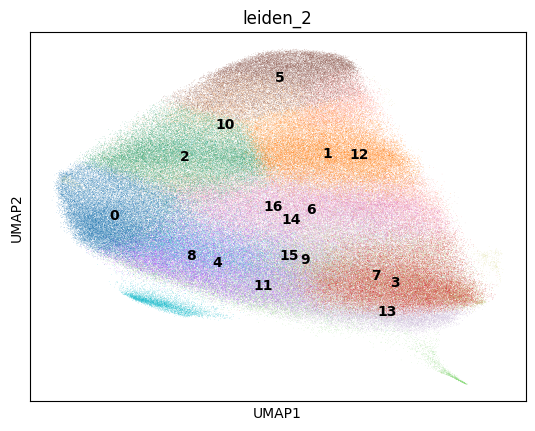

In [86]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

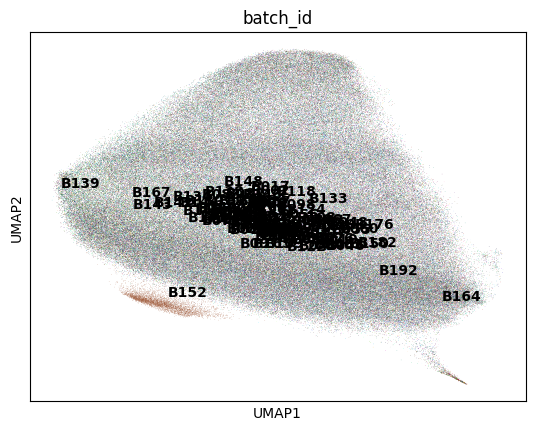

In [87]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

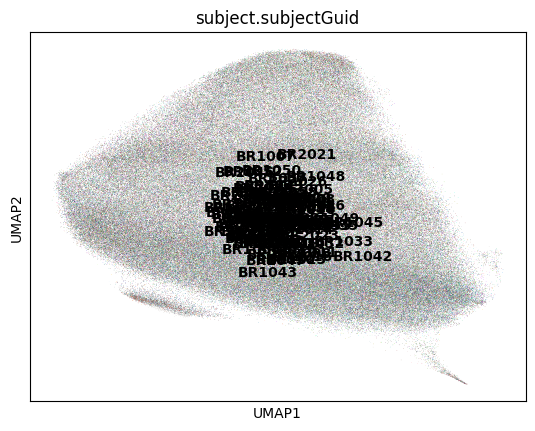

In [88]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

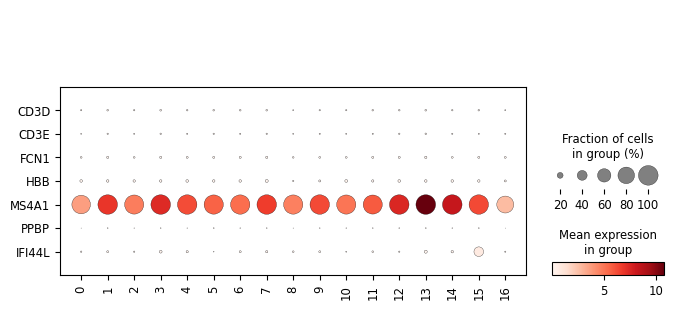

In [89]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

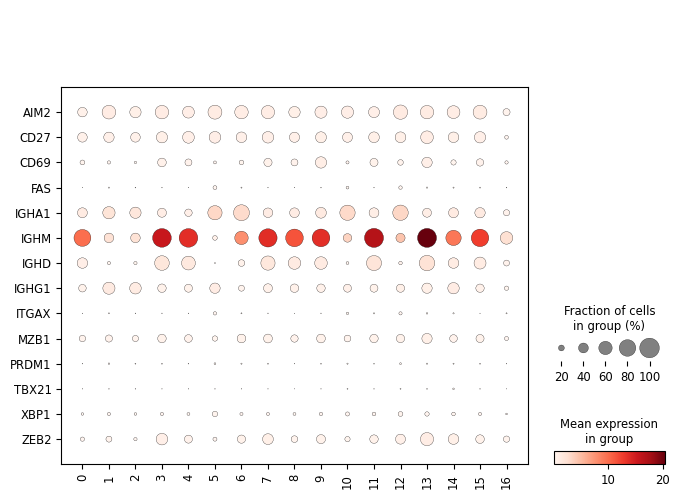

In [90]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Investigating outliers

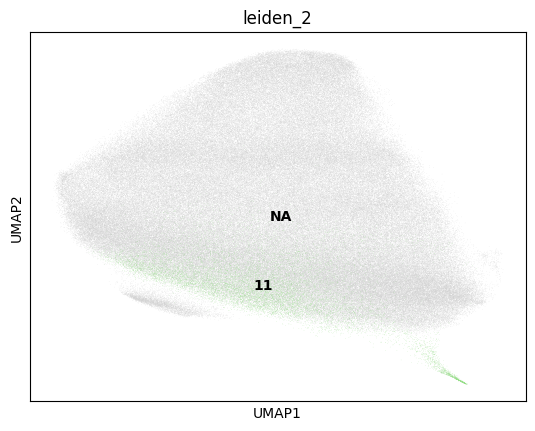

In [91]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = ['11'])

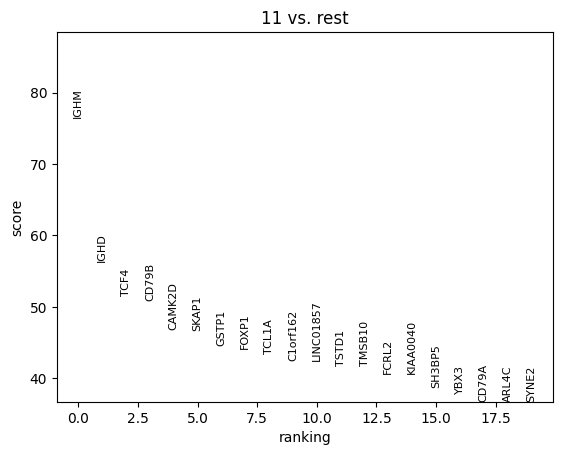

In [92]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['11']
)
sc.pl.rank_genes_groups(adata)

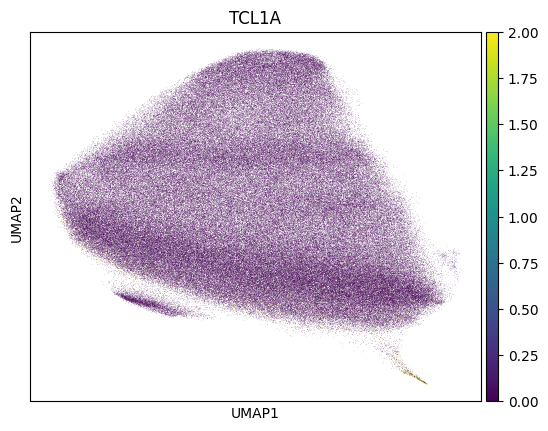

In [93]:
sc.pl.umap(adata, color = ['TCL1A'], vmax = 'p99')

### Comparison to original labels

In [94]:
adata = add_labels(adata, original_df)

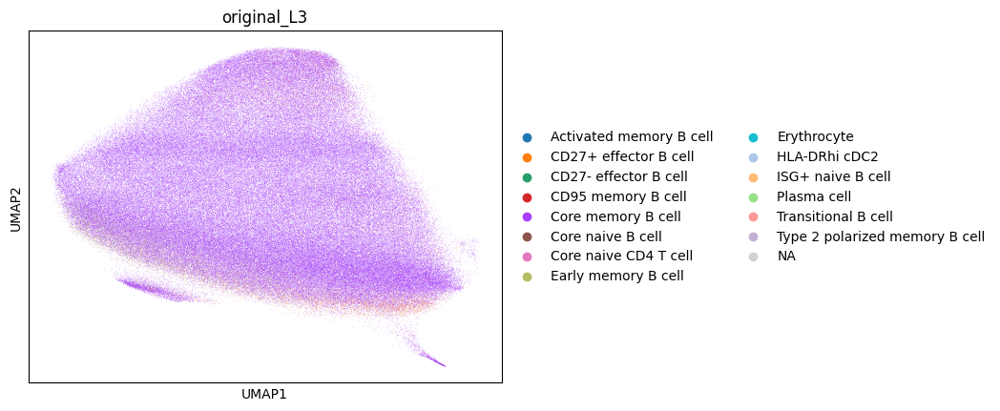

In [95]:
sc.pl.umap(adata, color = 'original_L3')

In [96]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core memory B cell                288094
CD27+ effector B cell               7983
Early memory B cell                 7840
NaN                                 3043
CD95 memory B cell                  2946
Type 2 polarized memory B cell      2893
Core naive B cell                   1775
ISG+ naive B cell                    826
CD27- effector B cell                728
Activated memory B cell              350
Transitional B cell                   15
Plasma cell                            5
Erythrocyte                            3
Core naive CD4 T cell                  2
HLA-DRhi cDC2                          1
Name: count, dtype: int64

In [97]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core memory B cell                0.910238
CD27+ effector B cell             0.025222
Early memory B cell               0.024771
NaN                               0.009614
CD95 memory B cell                0.009308
Type 2 polarized memory B cell    0.009140
Core naive B cell                 0.005608
ISG+ naive B cell                 0.002610
CD27- effector B cell             0.002300
Activated memory B cell           0.001106
Transitional B cell               0.000047
Plasma cell                       0.000016
Erythrocyte                       0.000009
Core naive CD4 T cell             0.000006
HLA-DRhi cDC2                     0.000003
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review Core naive B cell

In [98]:
cell_type = 'Core naive B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [99]:
type_uuid

'df11a11d-21c8-4e67-b64b-5e4822b98436'

In [100]:
adata = read_adata_uuid(type_uuid)

### Clustering

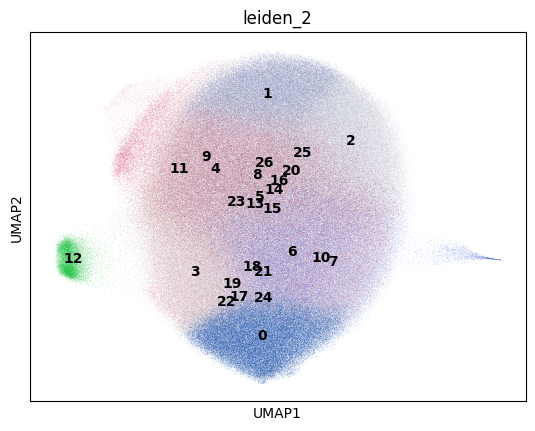

In [101]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

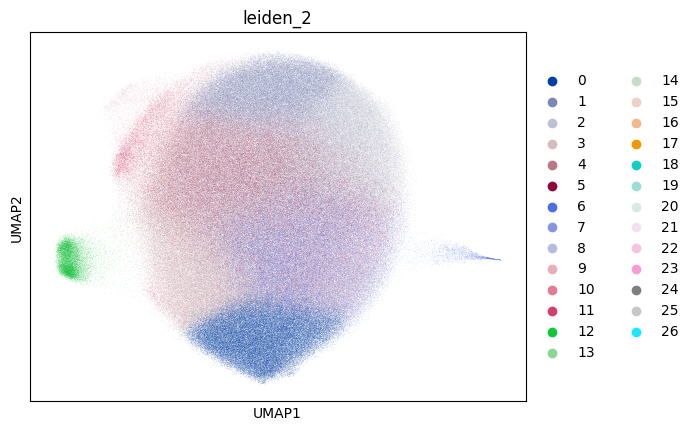

In [102]:
sc.pl.umap(adata, color = 'leiden_2')

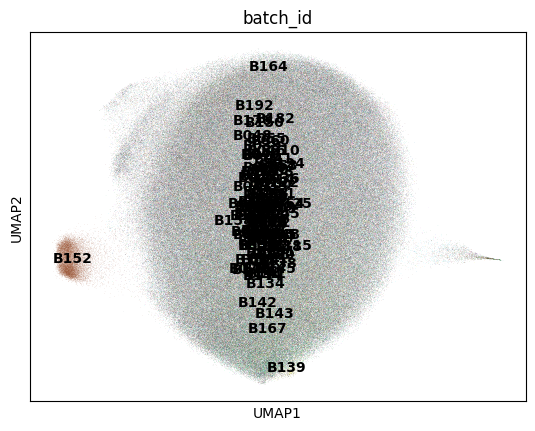

In [103]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

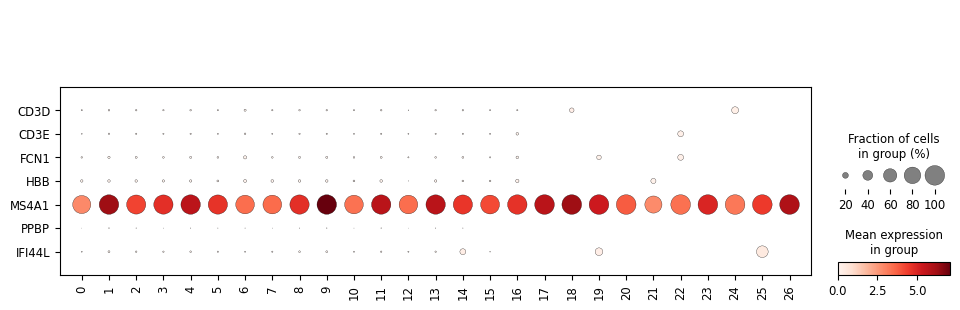

In [104]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

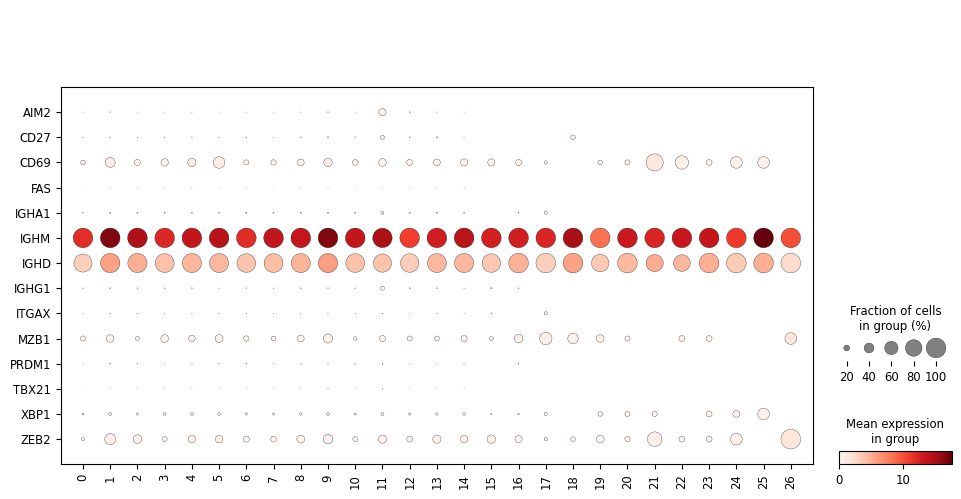

In [105]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

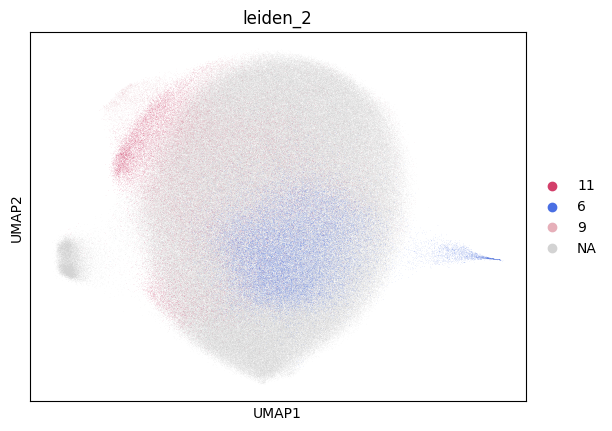

In [106]:
sc.pl.umap(adata, color = 'leiden_2', groups = ['6','9','11'])

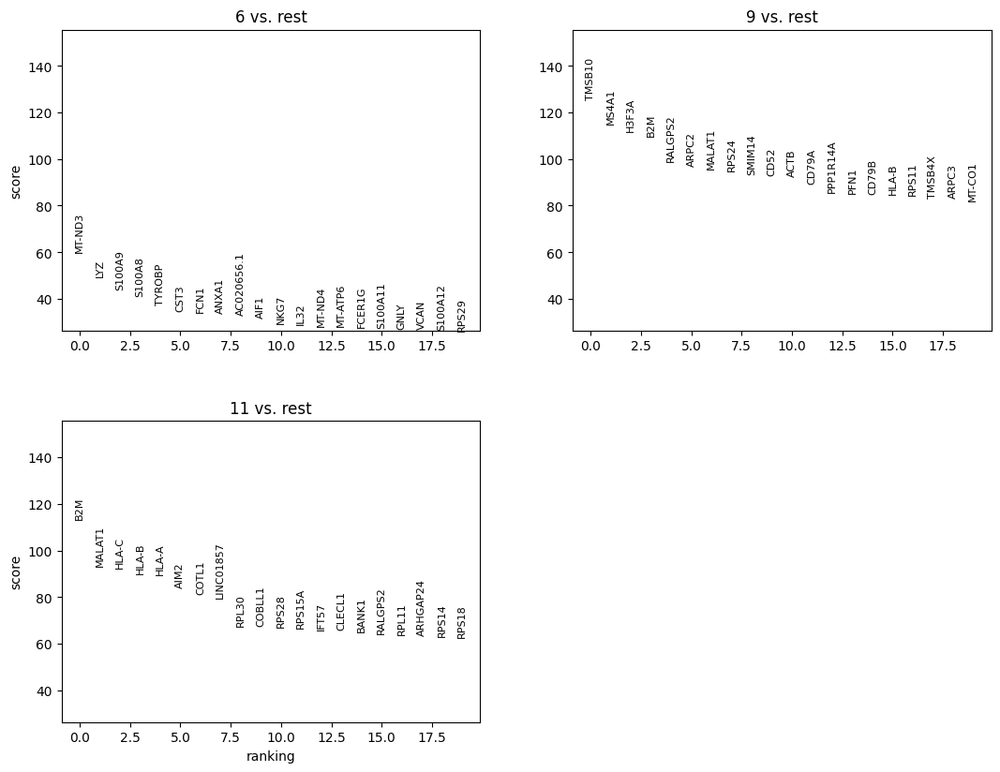

In [107]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['6','9','11']
)
sc.pl.rank_genes_groups(adata, ncols = 2)

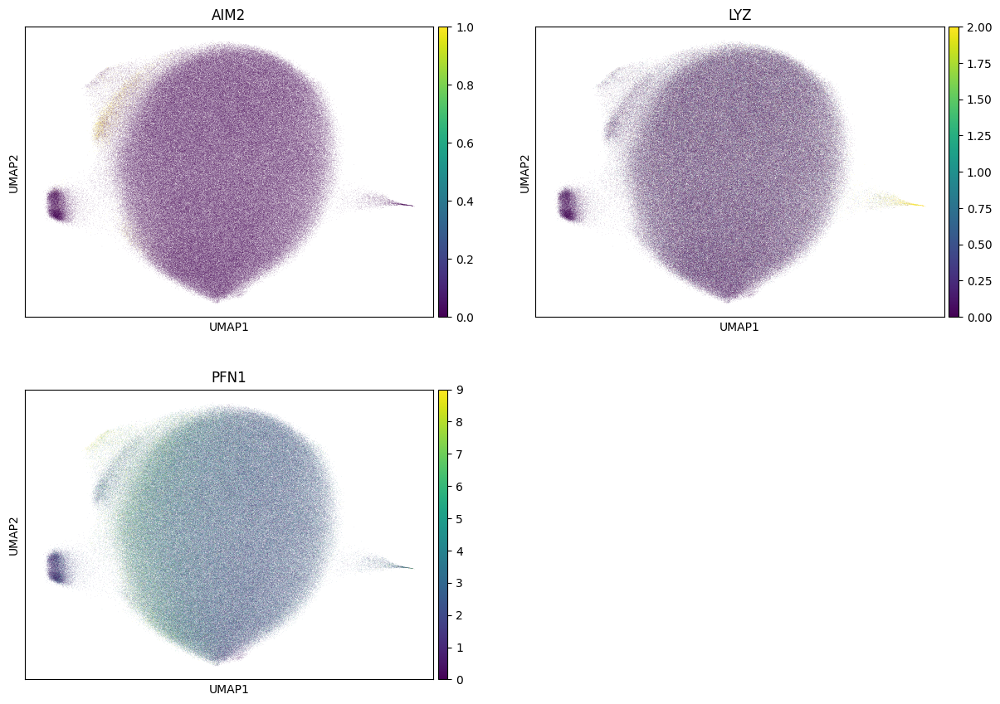

In [108]:
sc.pl.umap(adata, color = ['AIM2','LYZ','PFN1'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [109]:
adata = add_labels(adata, original_df)

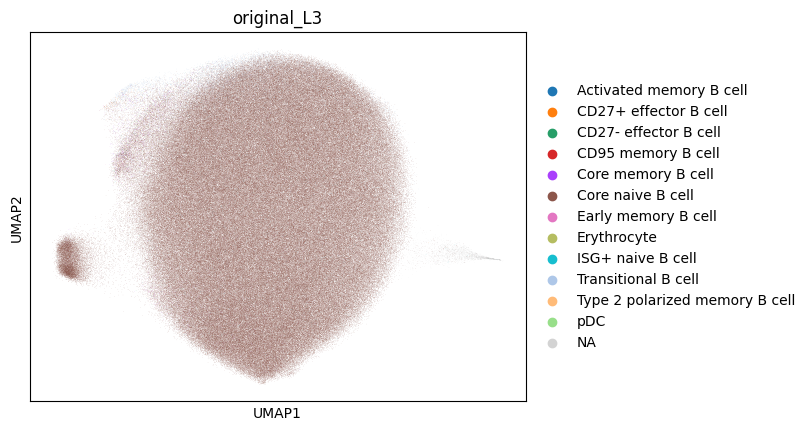

In [110]:
sc.pl.umap(adata, color = 'original_L3')

In [111]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core naive B cell                 627357
NaN                                12094
Transitional B cell                11525
Core memory B cell                  2077
ISG+ naive B cell                   2075
Early memory B cell                 1459
Type 2 polarized memory B cell       772
CD27- effector B cell                645
CD27+ effector B cell                195
Activated memory B cell               59
CD95 memory B cell                    38
Erythrocyte                            1
pDC                                    1
Name: count, dtype: int64

In [112]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core naive B cell                 0.952998
NaN                               0.018372
Transitional B cell               0.017507
Core memory B cell                0.003155
ISG+ naive B cell                 0.003152
Early memory B cell               0.002216
Type 2 polarized memory B cell    0.001173
CD27- effector B cell             0.000980
CD27+ effector B cell             0.000296
Activated memory B cell           0.000090
CD95 memory B cell                0.000058
Erythrocyte                       0.000002
pDC                               0.000002
Name: count, dtype: float64

### Proposed updates

- Iteratively cluster to remove high LYZ-expressing cluster (6) as possible Myeloid doublet
- Iteratively cluster to remove high PFN-expressing cluster (9) as mislabeled

## Review Early memory B cell

In [113]:
cell_type = 'Early memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [114]:
type_uuid

'abb5b9af-8c82-44f7-b101-833b80c1d48c'

In [115]:
adata = read_adata_uuid(type_uuid)

### Clustering

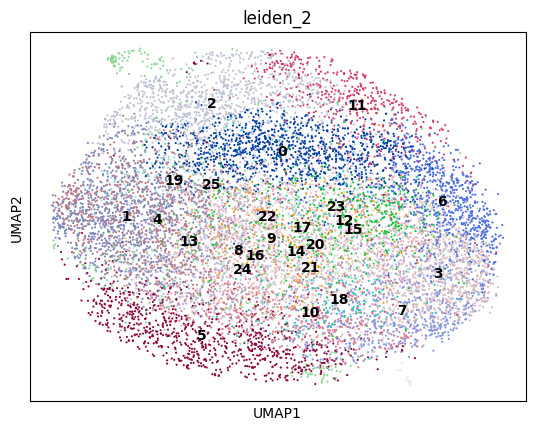

In [116]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

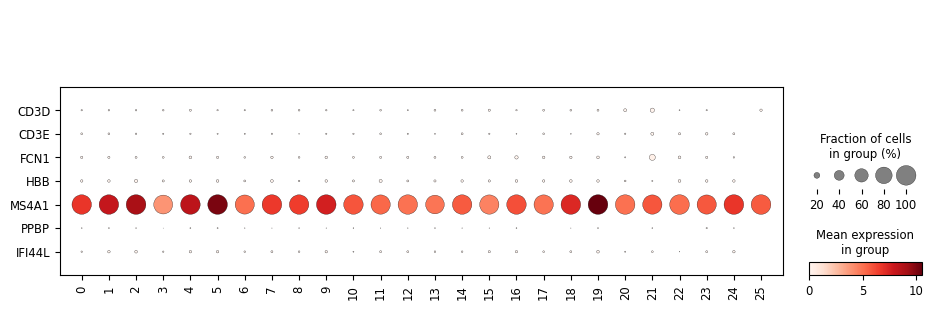

In [117]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

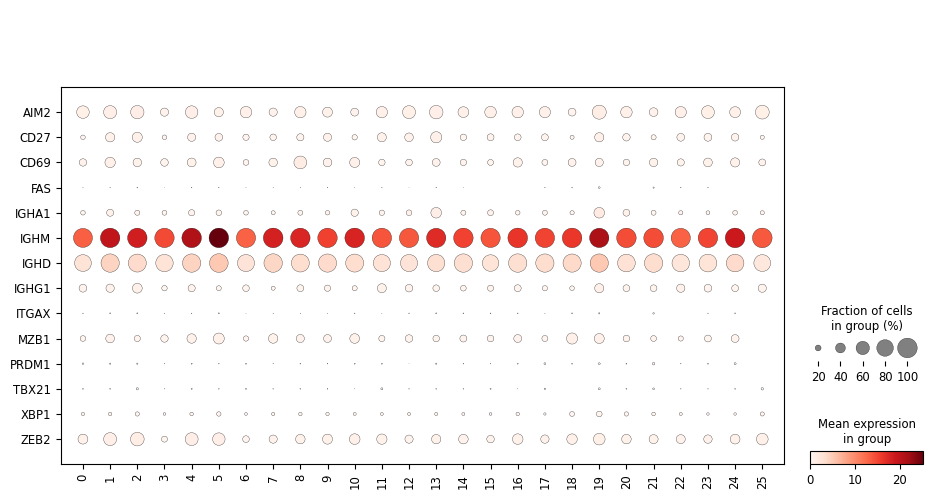

In [118]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Outlier investigation

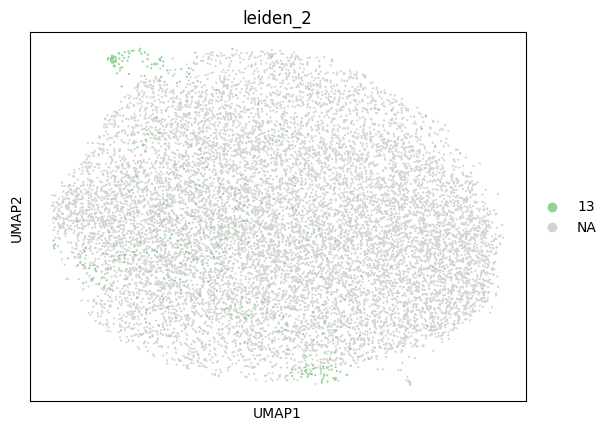

In [119]:
sc.pl.umap(adata, color = 'leiden_2', groups = '13')

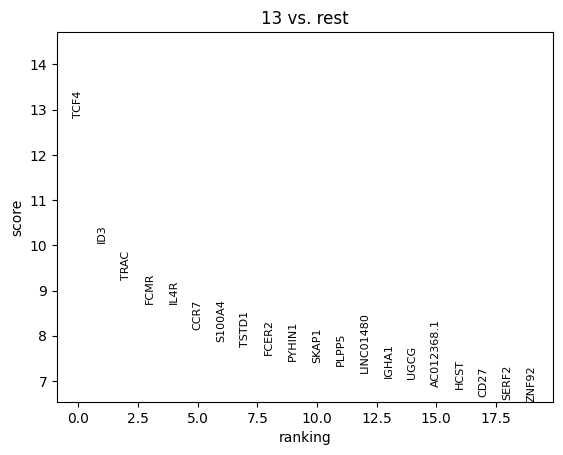

In [120]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['13']
)
sc.pl.rank_genes_groups(adata)

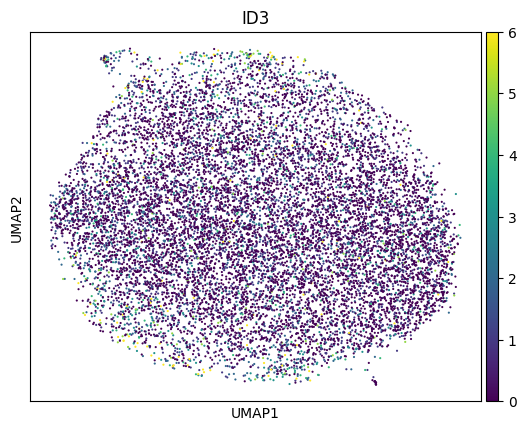

In [121]:
sc.pl.umap(adata, color = ['ID3'], vmax = 'p99', ncols = 2)

### Comparison to original labels

In [122]:
adata = add_labels(adata, original_df)

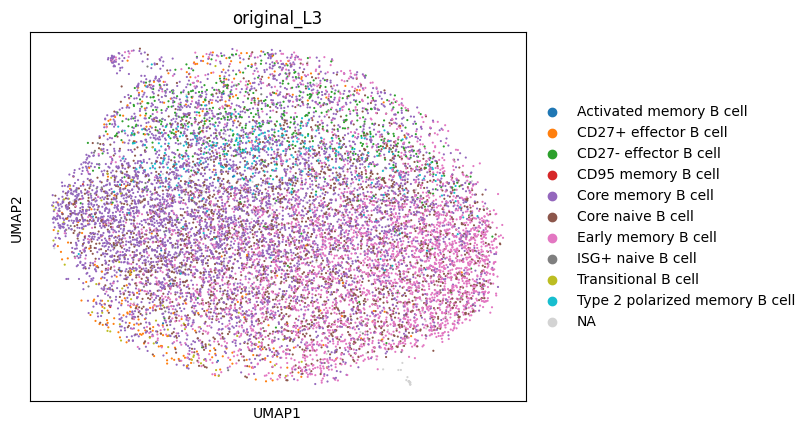

In [123]:
sc.pl.umap(adata, color = 'original_L3')

In [124]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Core memory B cell                4975
Early memory B cell               3606
Core naive B cell                 2493
CD27- effector B cell              532
Type 2 polarized memory B cell     310
CD27+ effector B cell              290
NaN                                139
ISG+ naive B cell                  121
Transitional B cell                 70
Activated memory B cell              9
CD95 memory B cell                   3
Name: count, dtype: int64

In [125]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Core memory B cell                0.396478
Early memory B cell               0.287376
Core naive B cell                 0.198677
CD27- effector B cell             0.042397
Type 2 polarized memory B cell    0.024705
CD27+ effector B cell             0.023111
NaN                               0.011077
ISG+ naive B cell                 0.009643
Transitional B cell               0.005579
Activated memory B cell           0.000717
CD95 memory B cell                0.000239
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review ISG+ naive B cell

In [126]:
cell_type = 'ISG+ naive B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [127]:
type_uuid

'e17bc485-f9e6-43b2-b9a9-a716673d4554'

In [128]:
adata = read_adata_uuid(type_uuid)

### Clustering

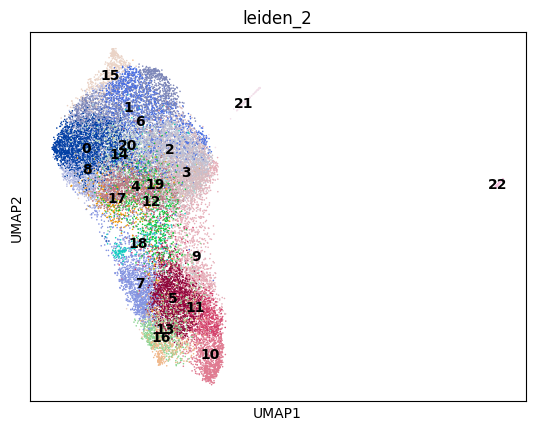

In [129]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

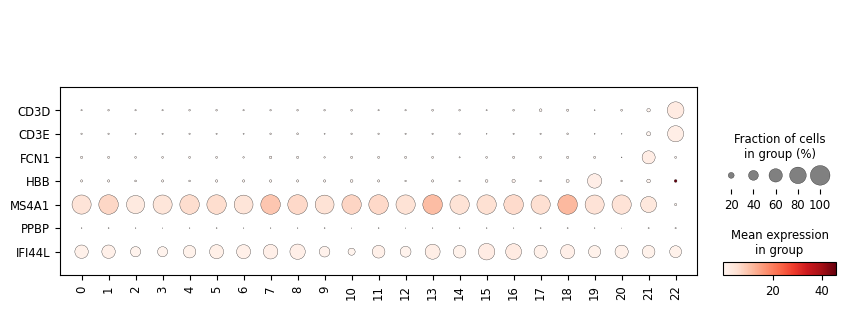

In [130]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

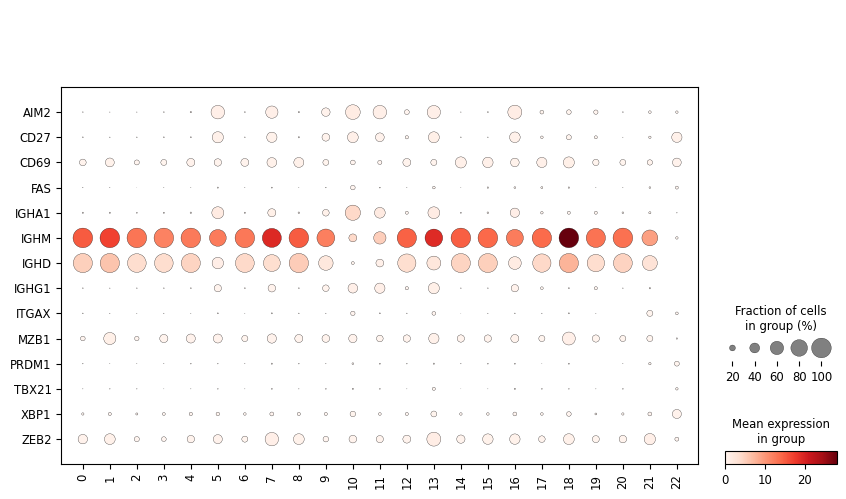

In [131]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [132]:
adata = add_labels(adata, original_df)

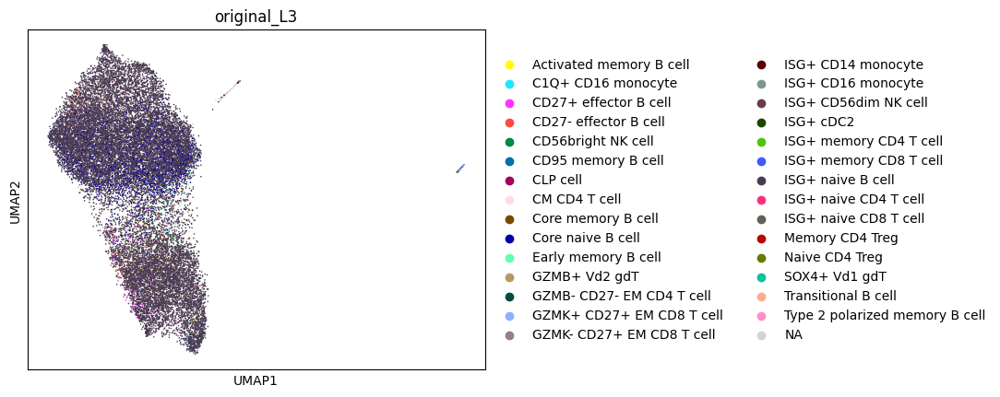

In [133]:
sc.pl.umap(adata, color = 'original_L3')

In [134]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ naive B cell                 20578
Core naive B cell                  1494
Core memory B cell                  461
NaN                                 262
Transitional B cell                 218
CD27+ effector B cell               149
Early memory B cell                 117
CD95 memory B cell                   54
CD27- effector B cell                46
Type 2 polarized memory B cell       27
ISG+ memory CD8 T cell               14
ISG+ memory CD4 T cell                8
ISG+ naive CD8 T cell                 6
ISG+ CD14 monocyte                    6
Activated memory B cell               5
ISG+ cDC2                             4
GZMK+ CD27+ EM CD8 T cell             4
ISG+ CD16 monocyte                    3
ISG+ CD56dim NK cell                  2
ISG+ naive CD4 T cell                 2
CM CD4 T cell                         2
Memory CD4 Treg                       2
SOX4+ Vd1 gdT                         2
CLP cell                              2
GZMK- CD27+ EM CD8 T cell   

In [135]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ naive B cell                 0.876629
Core naive B cell                 0.063645
Core memory B cell                0.019639
NaN                               0.011161
Transitional B cell               0.009287
CD27+ effector B cell             0.006347
Early memory B cell               0.004984
CD95 memory B cell                0.002300
CD27- effector B cell             0.001960
Type 2 polarized memory B cell    0.001150
ISG+ memory CD8 T cell            0.000596
ISG+ memory CD4 T cell            0.000341
ISG+ naive CD8 T cell             0.000256
ISG+ CD14 monocyte                0.000256
Activated memory B cell           0.000213
ISG+ cDC2                         0.000170
GZMK+ CD27+ EM CD8 T cell         0.000170
ISG+ CD16 monocyte                0.000128
ISG+ CD56dim NK cell              0.000085
ISG+ naive CD4 T cell             0.000085
CM CD4 T cell                     0.000085
Memory CD4 Treg                   0.000085
SOX4+ Vd1 gdT                     0.000085

### Proposed updates

- Remove high FCN1 cluster (21) as myeloid doublet
- Remove high CD3D cluster (22) as T cell doublet

## Review Plasma cell

In [167]:
cell_type = 'Plasma cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [168]:
type_uuid

'9fe09115-d520-442b-8bdf-3e3d5f35baa0'

In [169]:
adata = read_adata_uuid(type_uuid)

### Clustering

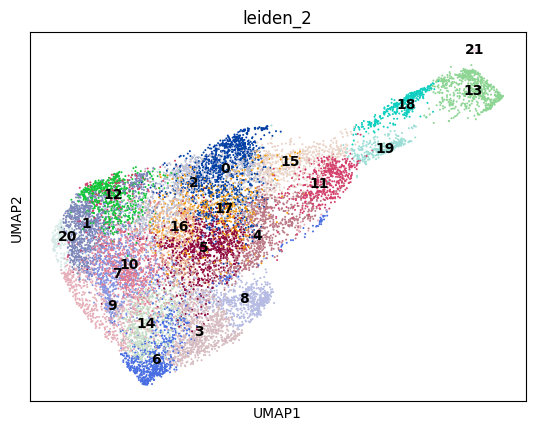

In [170]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

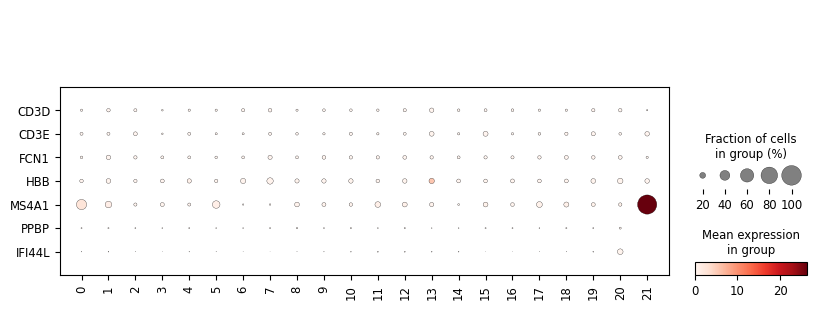

In [171]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

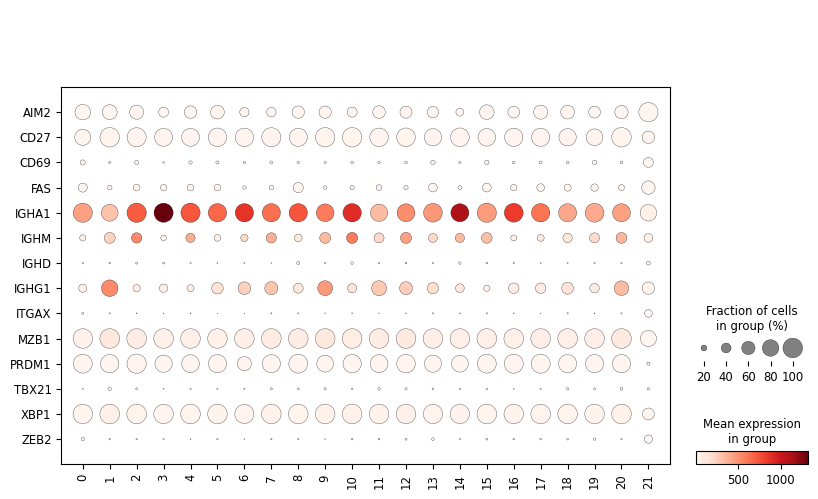

In [172]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

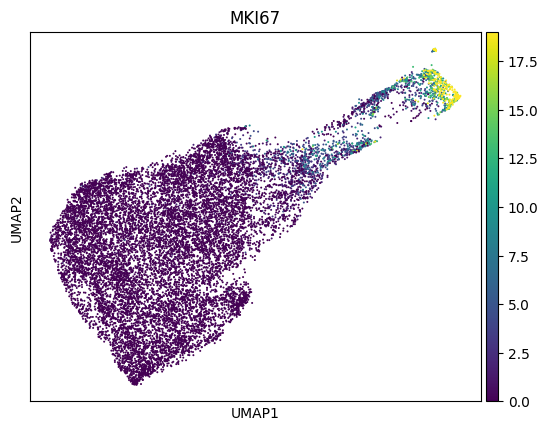

In [173]:
sc.pl.umap(adata, color = 'MKI67', vmax = 'p99')

### Cluster counts

In [174]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     1135
1      940
2      922
3      907
4      862
5      808
6      763
7      728
8      709
9      703
10     696
11     686
12     661
13     659
14     640
15     576
16     536
17     528
18     371
19     327
20     268
21      35
Name: count, dtype: int64

### Comparison to original labels

In [143]:
adata = add_labels(adata, original_df)

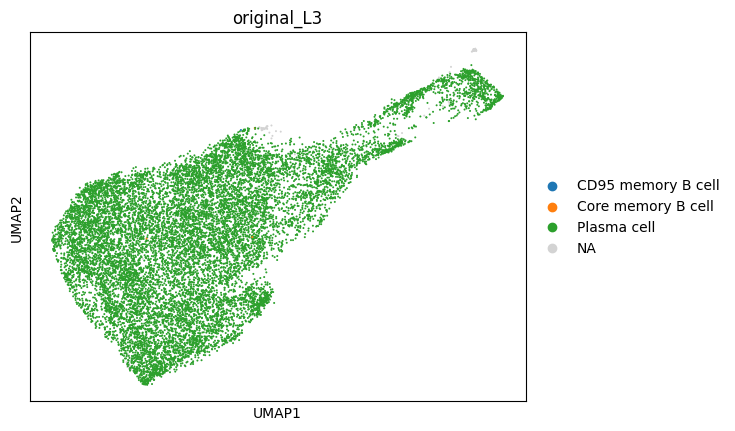

In [144]:
sc.pl.umap(adata, color = 'original_L3')

In [145]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Plasma cell           14331
NaN                     125
Core memory B cell        3
CD95 memory B cell        1
Name: count, dtype: int64

In [146]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Plasma cell           0.991079
NaN                   0.008645
Core memory B cell    0.000207
CD95 memory B cell    0.000069
Name: count, dtype: float64

### Proposed updates

- Remove CD20/MS4A1+ cluster (21) as Mislabeled B cells?

## Review Transitional B cell

In [147]:
cell_type = 'Transitional B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [148]:
type_uuid

'f7298bba-c15f-4389-9229-557e34d3b082'

In [149]:
adata = read_adata_uuid(type_uuid)

### Clustering

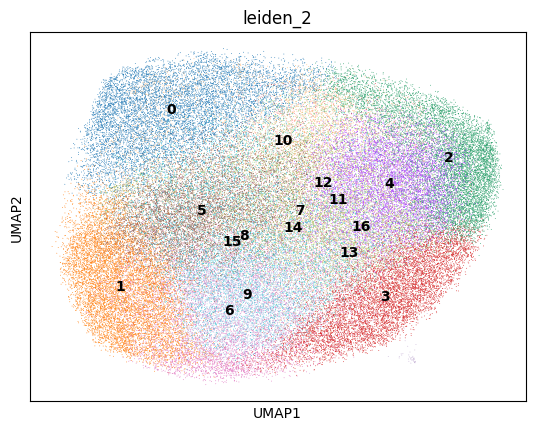

In [150]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

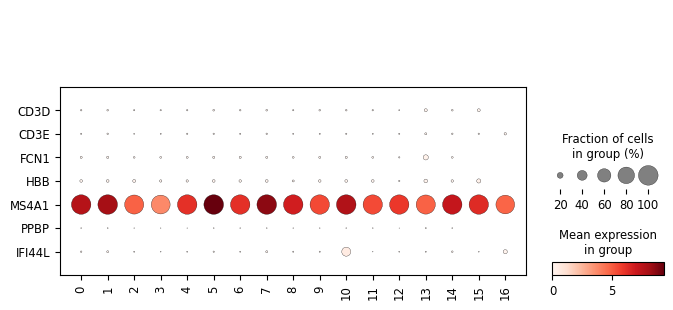

In [151]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

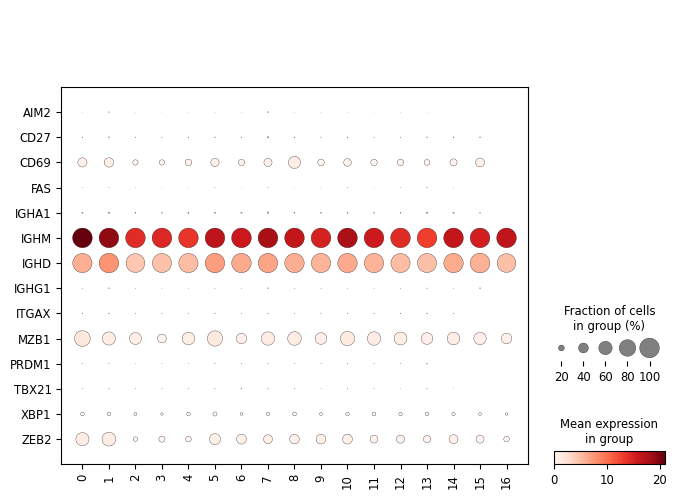

In [152]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [153]:
adata = add_labels(adata, original_df)

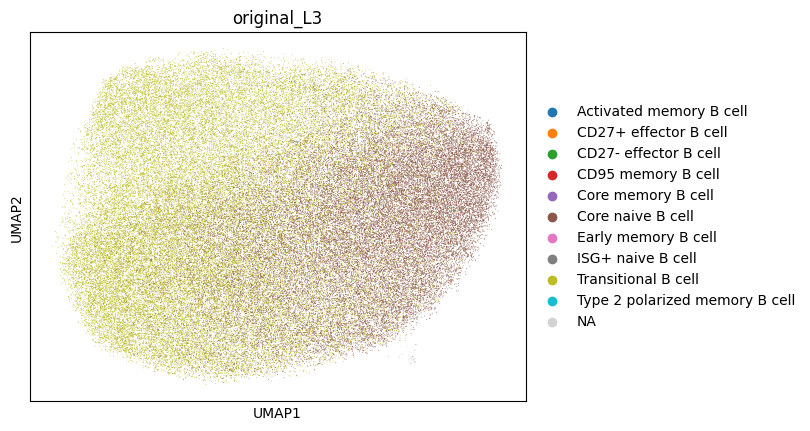

In [154]:
sc.pl.umap(adata, color = 'original_L3')

In [155]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Transitional B cell               46463
Core naive B cell                 33424
NaN                                 830
ISG+ naive B cell                   524
CD27+ effector B cell               123
CD27- effector B cell               105
Core memory B cell                   42
Early memory B cell                  38
CD95 memory B cell                   15
Activated memory B cell              11
Type 2 polarized memory B cell       10
Name: count, dtype: int64

In [156]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Transitional B cell               0.569504
Core naive B cell                 0.409683
NaN                               0.010173
ISG+ naive B cell                 0.006423
CD27+ effector B cell             0.001508
CD27- effector B cell             0.001287
Core memory B cell                0.000515
Early memory B cell               0.000466
CD95 memory B cell                0.000184
Activated memory B cell           0.000135
Type 2 polarized memory B cell    0.000123
Name: count, dtype: float64

### Proposed updates

No proposed changes

## Review Type 2 polarized memory B cell

In [157]:
cell_type = 'Type 2 polarized memory B cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [158]:
type_uuid

'51407044-2903-4a29-ba3f-f3092ee50ea3'

In [159]:
adata = read_adata_uuid(type_uuid)

### Clustering

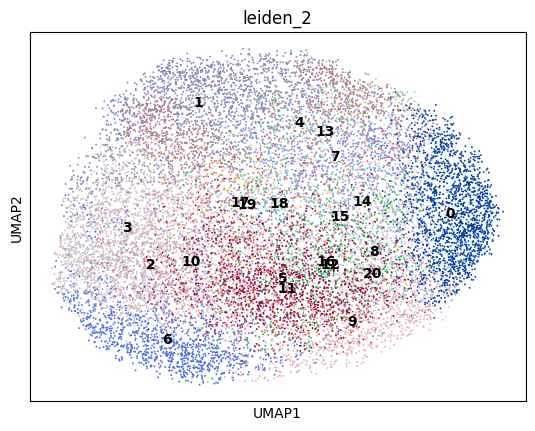

In [160]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

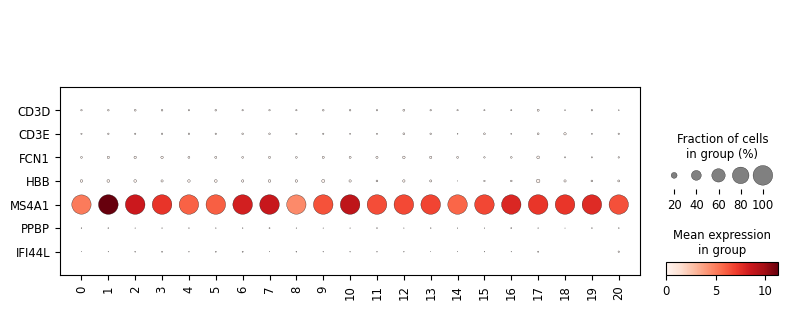

In [161]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

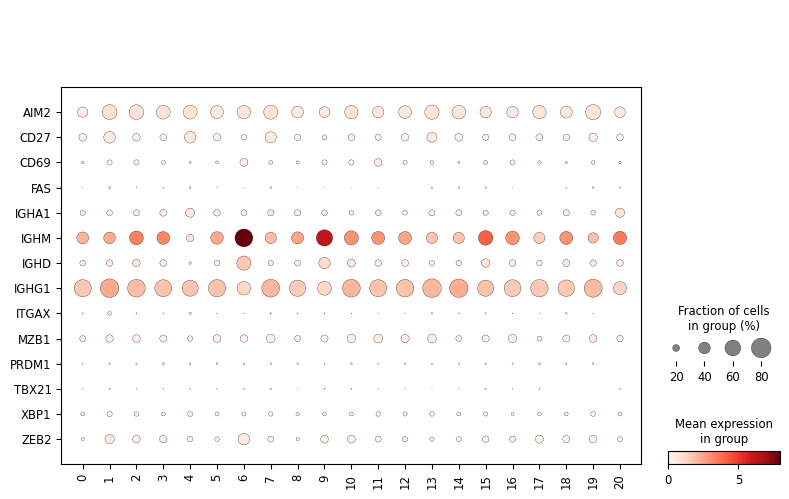

In [162]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [163]:
adata = add_labels(adata, original_df)

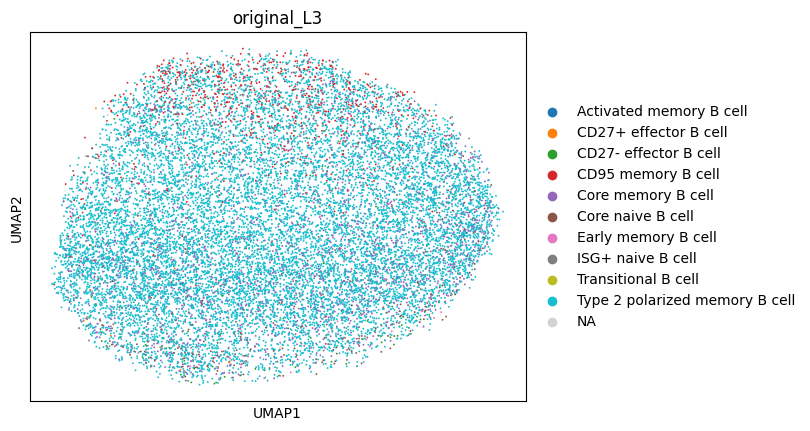

In [164]:
sc.pl.umap(adata, color = 'original_L3')

In [165]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Type 2 polarized memory B cell    13414
Core memory B cell                 2025
CD95 memory B cell                  762
Core naive B cell                   366
CD27- effector B cell                80
ISG+ naive B cell                    47
NaN                                  41
Early memory B cell                  26
CD27+ effector B cell                17
Activated memory B cell              14
Transitional B cell                   1
Name: count, dtype: int64

In [166]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Type 2 polarized memory B cell    0.798785
Core memory B cell                0.120586
CD95 memory B cell                0.045376
Core naive B cell                 0.021795
CD27- effector B cell             0.004764
ISG+ naive B cell                 0.002799
NaN                               0.002441
Early memory B cell               0.001548
CD27+ effector B cell             0.001012
Activated memory B cell           0.000834
Transitional B cell               0.000060
Name: count, dtype: float64

### Proposed updates

No proposed changes